# Importing Libraries

In [17]:
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from datasets import load_dataset
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd
import numpy as np
import pyarrow.parquet as pq
import seaborn as sns
import matplotlib.pyplot as plt

# Loading Dataset (IMDb test dataset)

                                                text  label
0  I love sci-fi and am willing to put up with a ...      0
1  Worth the entertainment value of a rental, esp...      0
2  its a totally average film with a few semi-alr...      0
3  STAR RATING: ***** Saturday Night **** Friday ...      0
4  First off let me say, If you haven't enjoyed a...      0


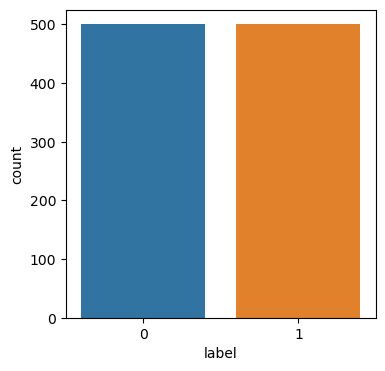

In [18]:
# Load IMDb dataset (test data , 1000 instances)

test_data = pd.read_csv('test_data.csv')
print(test_data.head())

#test dataset category count plot 
plt.figure(figsize=(4, 4))
sns.countplot(x='label', data=test_data)
plt.show()

# Pretrained Models Used

In [19]:
# Pretrained models for sentiment analysis
models = [
    "cardiffnlp/twitter-roberta-base-sentiment",
    "textattack/bert-base-uncased-SST-2",
    "aychang/roberta-base-imdb",
    "t5-small"
]


# Tokenizing and Getting predictions 

In [20]:


# Tokenize and get predictions for each model
results = []

for model_name in models:
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForSequenceClassification.from_pretrained(model_name)

    predictions = []

    for i in range(len(test_data)):
        example = test_data.iloc[i,:]
        # print(example)
        inputs = tokenizer(example["text"], return_tensors="pt", max_length=500,truncation=True)
        print(inputs)
        outputs = model(**inputs)
        logits = outputs.logits
        predicted_class = torch.argmax(logits, dim=1).item()
        predictions.append(predicted_class)
    # print(predictions)

    results.append(predictions)


{'input_ids': tensor([[    0,   100,   657, 19974,    12,  9169,     8,   524,  2882,     7,
           342,    62,    19,    10,   319,     4, 22640,    12,  9169,  4133,
            73,  2915,    32,  2333,   223, 11856,     6,   223,    12,  3340,
         19954,  1070,     8, 32085,     4,    38,  1381,     7,   101,    42,
             6,    38,   269,   222,     6,    53,    24,    16,     7,   205,
          1012, 19974,    12,  9169,    25, 41170,   195,    16,     7,  2141,
         20351,    36,   627,  1461,   322,   208, 10758, 22115, 34680,     6,
          6162, 25081,  3880,     6,  1690,   718,  5357, 25730,  3663,     6,
         33354,    14,   630,    75,   914,     5,  3618,     6,     8, 32020,
            65,    12, 23944,  3768,  1395,    28,  6647,    19,    10,   128,
         43428,    12,  9169,   108,  2749,     4,    36,   100,   437,   686,
            89,    32,   167,     9,    47,    66,    89,    54,   206, 41170,
           195,    16,   205, 19974,  

Some weights of T5ForSequenceClassification were not initialized from the model checkpoint at t5-small and are newly initialized: ['classification_head.out_proj.weight', 'classification_head.out_proj.bias', 'classification_head.dense.weight', 'classification_head.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


{'input_ids': tensor([[   27,   333, 17201,    18,    89,    23,    11,   183,  4403,    12,
           474,    95,    28,     3,     9,   418,     5, 16021,    18,    89,
            23,  4876,    87,  4562,    33,  1086,   365, 18532,     6,   365,
            18,  3096,  7886,   920,    11,  1817,  7248,     7,   235,    32,
            26,     5,    27,  1971,    12,   114,    48,     6,    27,   310,
           410,     6,    68,    34,    19,    12,   207,  1424, 17201,    18,
            89,    23,    38, 30622,   305,    19,    12,  2042, 20350,    41,
           532,   926,   137, 10221,   120,  7796, 17194,     7,     6,  2877,
         21451,  3369,     6,  7627,  1054,  7478,     7,     6,     3, 12150,
            24,   744,    31,    17,  1588,     8,  2458,     6,    11, 10875,
           120,    80,    18, 11619,  2850,  1178,    36,  8269,    28,     3,
             9,     3,    31,     7,    75,    23,    18,    89,    23,    31,
          1898,     5,    41,   196,  

# Evaluating Predictions

In [21]:
# Evaluate model performance using metrics
metrics_data = []

for i, model_name in enumerate(models):
    true_labels = test_data.iloc[:,1]
    predicted_labels = results[i]

    accuracy = accuracy_score(true_labels, predicted_labels)
    precision = precision_score(true_labels, predicted_labels, average="weighted" , zero_division=0)
    recall = recall_score(true_labels, predicted_labels, average='weighted', zero_division=0)
    f1 = f1_score(true_labels, predicted_labels, average="weighted")

    metrics_data.append({"Model": f"Model_{i}", "Accuracy": accuracy, "Precision": precision, "Recall": recall, "F1": f1})

# Create a DataFrame to store the metrics
metrics_df = pd.DataFrame(metrics_data)
print(metrics_df)



     Model  Accuracy  Precision  Recall        F1
0  Model_0     0.503   0.761503   0.503  0.585072
1  Model_1     0.901   0.901130   0.901  0.900992
2  Model_2     0.947   0.947403   0.947  0.946988
3  Model_3     0.500   0.250000   0.500  0.333333


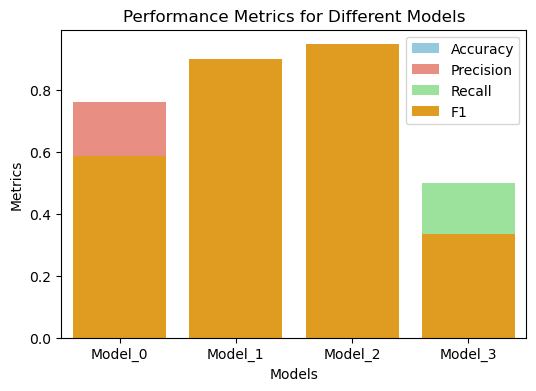

In [22]:
plt.figure(figsize=(6, 4))

# Plotting metrics for different models
sns.barplot(x='Model', y='Accuracy', data=metrics_df, label='Accuracy', color='skyblue')
sns.barplot(x='Model', y='Precision', data=metrics_df, label='Precision', color='salmon')
sns.barplot(x='Model', y='Recall', data=metrics_df, label='Recall', color='lightgreen')
sns.barplot(x='Model', y='F1', data=metrics_df, label='F1', color='orange')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('Metrics')
plt.title('Performance Metrics for Different Models')
plt.legend()

# Show the plot
plt.show()

# Defining TOPSIS function

In [23]:
#defining the TOPSIS function

def TOPSIS(array , weights ,signs):

    #preserving original array values
    original_array = array.copy()
    array = array.iloc[:,1:]
    
    #normalizing array
    normalized_array = array/np.linalg.norm(array, axis=0)
    #weighted array
    array_weighted = normalized_array*weights

    #best and worst values 
    best_values = np.max(array_weighted, axis=0) if any(signs) else np.min(array_weighted, axis=0)
    worst_values = np.min(array_weighted, axis=0) if any(signs) else np.max(array_weighted, axis=0)

    #calculating distances
    distance_best = np.linalg.norm(array_weighted - best_values, axis=1)
    distance_worst = np.linalg.norm(array_weighted - worst_values, axis=1)

    #calculating topsis scores
    topsis_scores = distance_worst / (distance_best + distance_worst)

    #appending scores in array
    modified_array = np.column_stack((original_array, topsis_scores))

    #appending rank
    ranked_indices = np.argsort(topsis_scores)[::-1]
    ranked_array = modified_array[ranked_indices]

    # Append ranks to the ranked matrix
    ranks = np.arange(1, len(array) + 1)
    ranked_array = np.column_stack((ranked_array, ranks))

    #returning ranked array
    return ranked_array

# Applying TOPSIS

In [24]:
# Defining weights for criteria
weights = [0.25, 0.25, 0.25, 0.25]

# Maximizing or Minimizing the parameter
signs = [1,1,1,1]


ranked_array = pd.DataFrame(TOPSIS(metrics_df, weights, signs))
ranked_array.columns = ["Model","accuracy" , "precision" , "recall" , "F1 Score" , "Topsis Score" , "TOPSIS Rank"]


print(ranked_array)


     Model accuracy precision recall  F1 Score Topsis Score TOPSIS Rank
0  Model_2    0.947  0.947403  0.947  0.946988          1.0           1
1  Model_1    0.901   0.90113  0.901  0.900992     0.917854           2
2  Model_0    0.503  0.761503  0.503  0.585072     0.426789           3
3  Model_3      0.5      0.25    0.5  0.333333          0.0           4
